In [ ]:
#This assignment requires more effort than the in-class assignments. You may seek help fromyour peer(s) for the review purpose. If you do that,
#mention it in an acknowledgment section. Itwill not impact your grade. However, you cannot submit others’ work or work jointly with
#someone. This assignment has two parts. Your final deliverable will be a Word document. See
#below for more instructions.

In [ ]:
#Part A (i) Use two or more deep learning algorithms from the computer vision area to extract
#objects from a series of images and compare their performance in terms of time,
#objects detected, and probabilities. You can choose 5 or 10 images of your own and
#record these outputs for each of them. In the end, those outcomes will be presented
#in a tabular format. 10 points

In [45]:
# Install YOLOv8 (Ultralytics), OpenCV, Matplotlib, and Pandas
!pip install ultralytics opencv-python matplotlib pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 32.6 MB/s eta 0:00:00


# New Section

In [51]:
import time
import cv2
from ultralytics import YOLO  # YOLOv8 library
import pandas as pd
import numpy as np
from scipy import stats

# Load YOLOv8 pre-trained model
yolo_model = YOLO("yolov8n.pt")  # Use YOLOv8 nano model for speed

# List of image file names
image_paths = ["photo1.jpg", "photo2.jpg", "photo3.jpg", "photo4.jpg", "photo5.jpg", "photo6.jpg", "photo7.jpg"]

# List to store results
results = []

# Perform object detection with YOLO
for img_path in image_paths:
    img = cv2.imread(img_path)  # Read the image
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB as YOLO requires it

    # Start the timer
    start_time = time.time()
    # Run YOLO object detection
    predictions = yolo_model(img_rgb)
    # End the timer
    detection_time = time.time() - start_time

    # Extract the number of objects detected and their confidence scores
    objects_detected = len(predictions[0].boxes)  # Total objects detected
    probabilities = [round(float(box.conf[0]), 2) for box in predictions[0].boxes]  # Confidence scores

    # Calculate confidence interval (95% confidence level)
    confidence_interval = stats.t.interval(
        0.95, len(probabilities) - 1, loc=np.mean(probabilities), scale=stats.sem(probabilities)
    )



    # Append results
    results.append([img_path, detection_time, objects_detected, probabilities, confidence_interval])

# Display results in tabular format
import pandas as pd

# Create DataFrame
columns = ["Image", "YOLO Detection Time (s)", "Objects Detected", "Confidence Scores", "Confidence Interval"]
df = pd.DataFrame(results, columns=columns)

# Print the results
print(df)


0: 448x640 9 persons, 4 cars, 4 traffic lights, 184.5ms
Speed: 2.6ms preprocess, 184.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 7 persons, 3 horses, 172.4ms
Speed: 4.9ms preprocess, 172.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 640x512 1 chair, 3 couchs, 189.9ms
Speed: 7.2ms preprocess, 189.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)

0: 640x544 3 couchs, 2 potted plants, 220.0ms
Speed: 4.3ms preprocess, 220.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 544)

0: 384x640 7 persons, 1 bicycle, 1 car, 1 bus, 1 truck, 1 traffic light, 1 handbag, 166.7ms
Speed: 4.5ms preprocess, 166.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 480x640 1 fire hydrant, 3 dogs, 196.1ms
Speed: 4.7ms preprocess, 196.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 7 persons, 1 dog, 1 umbrella, 164.0ms
Speed: 2.3ms preprocess, 164.0ms inferenc


0: 448x640 9 persons, 4 cars, 4 traffic lights, 260.3ms
Speed: 4.5ms preprocess, 260.3ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


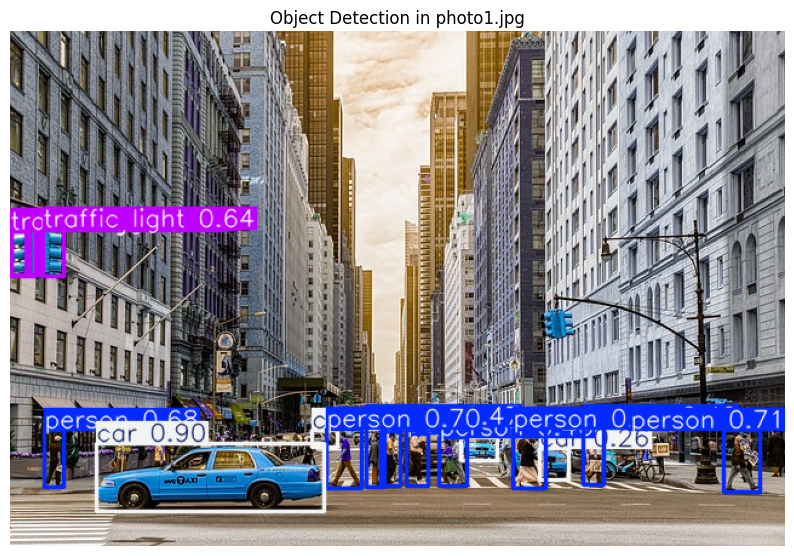


0: 480x640 7 persons, 3 horses, 283.1ms
Speed: 3.8ms preprocess, 283.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


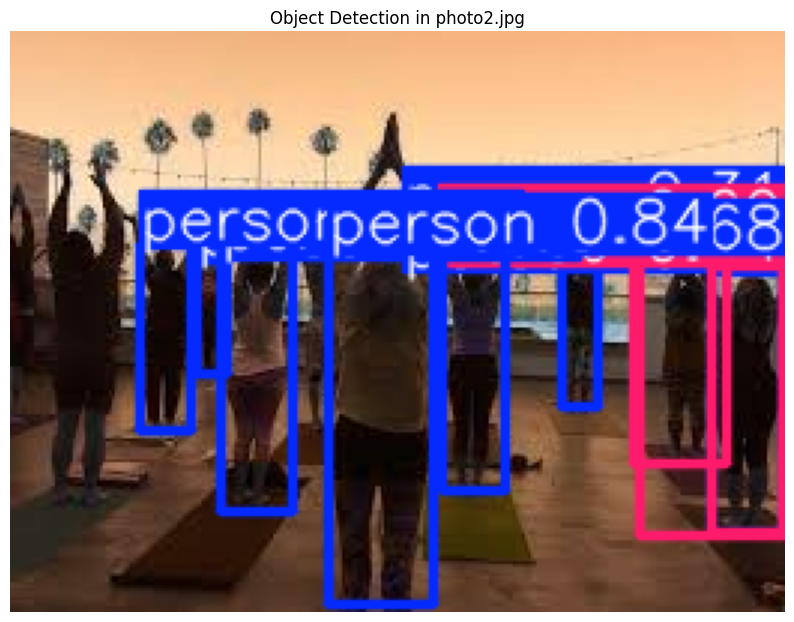


0: 640x512 1 chair, 3 couchs, 239.4ms
Speed: 5.3ms preprocess, 239.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)


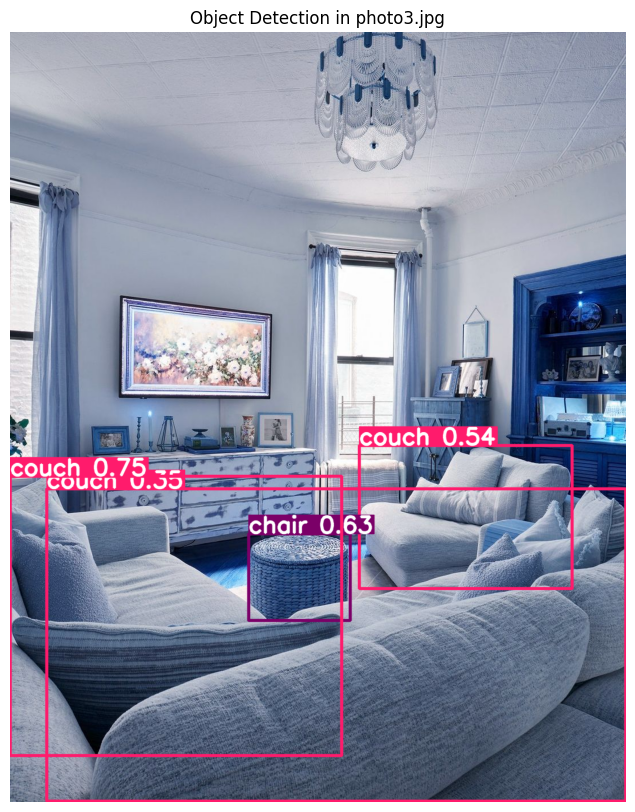


0: 640x544 3 couchs, 2 potted plants, 284.9ms
Speed: 3.7ms preprocess, 284.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 544)


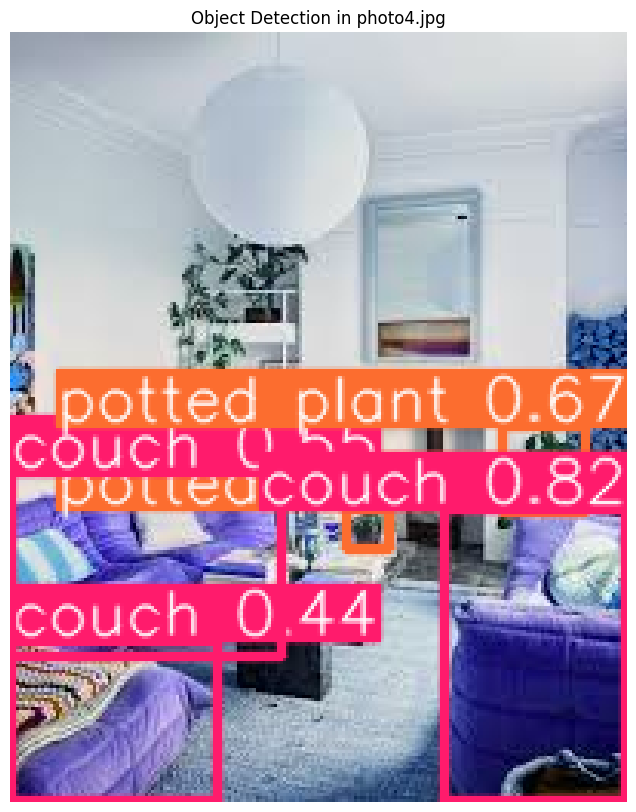


0: 384x640 7 persons, 1 bicycle, 1 car, 1 bus, 1 truck, 1 traffic light, 1 handbag, 155.7ms
Speed: 4.8ms preprocess, 155.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


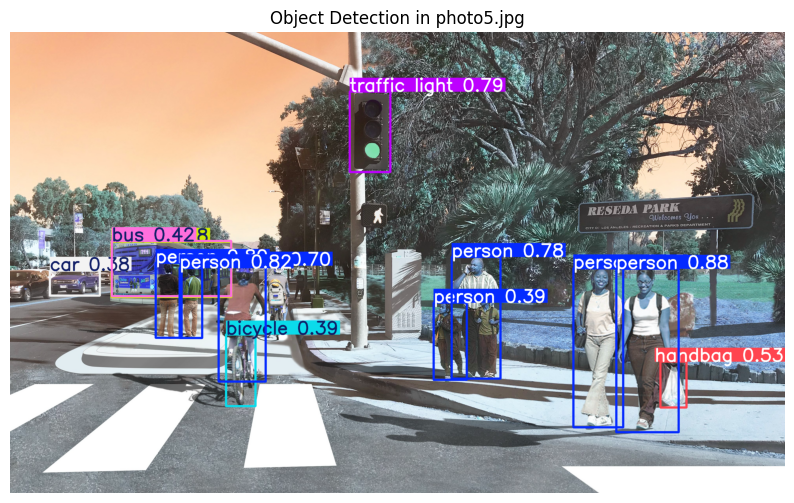


0: 480x640 1 fire hydrant, 3 dogs, 279.9ms
Speed: 5.0ms preprocess, 279.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


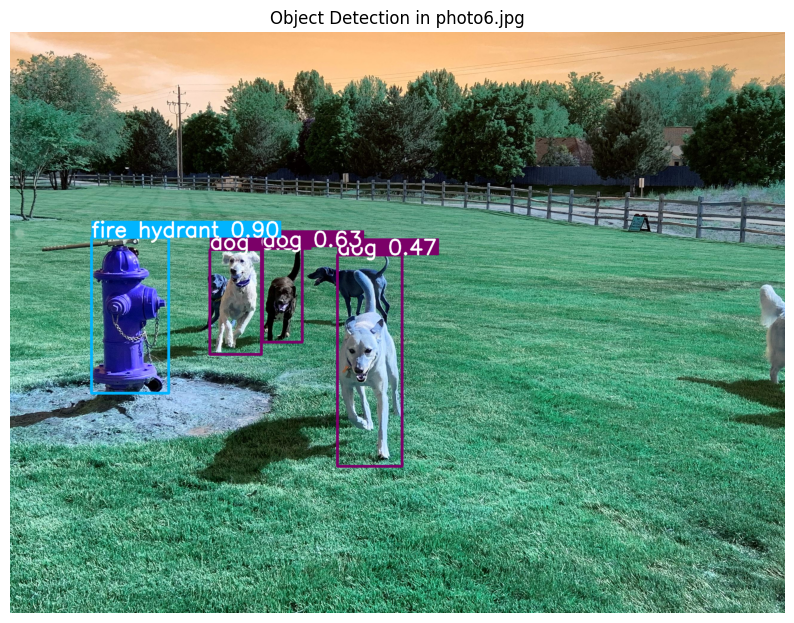


0: 448x640 7 persons, 1 dog, 1 umbrella, 260.6ms
Speed: 3.4ms preprocess, 260.6ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


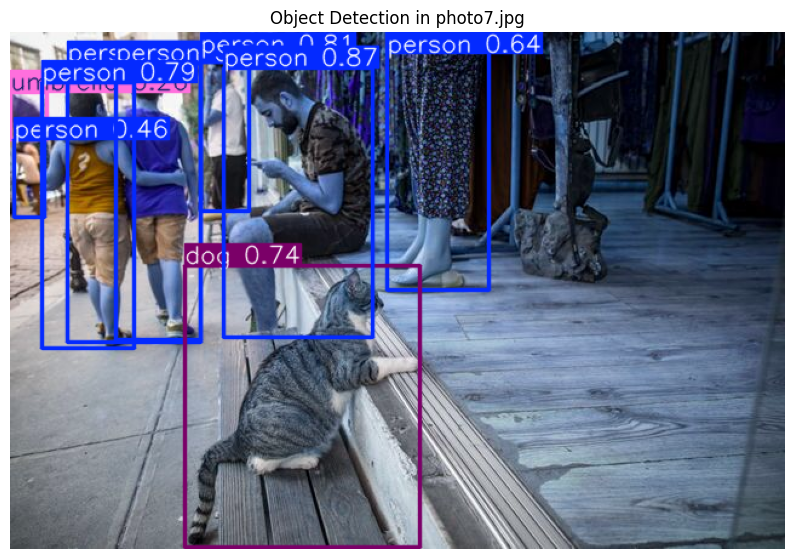

In [37]:
pip install torch torchvision


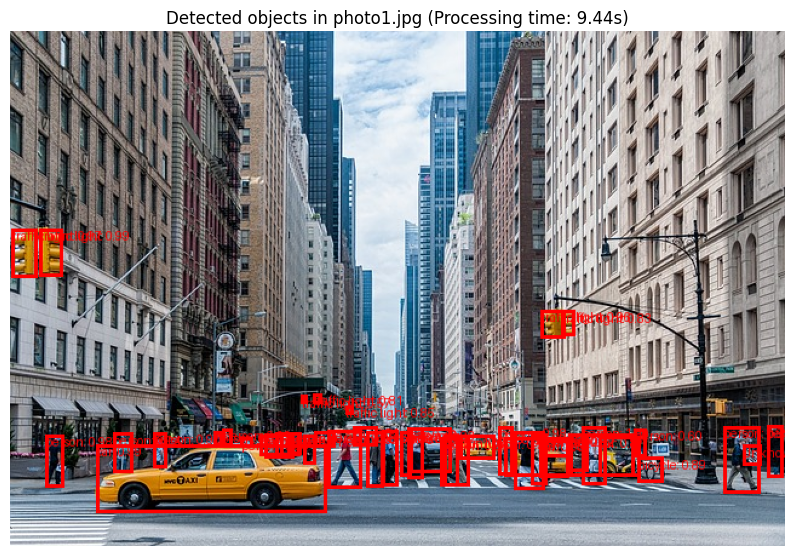

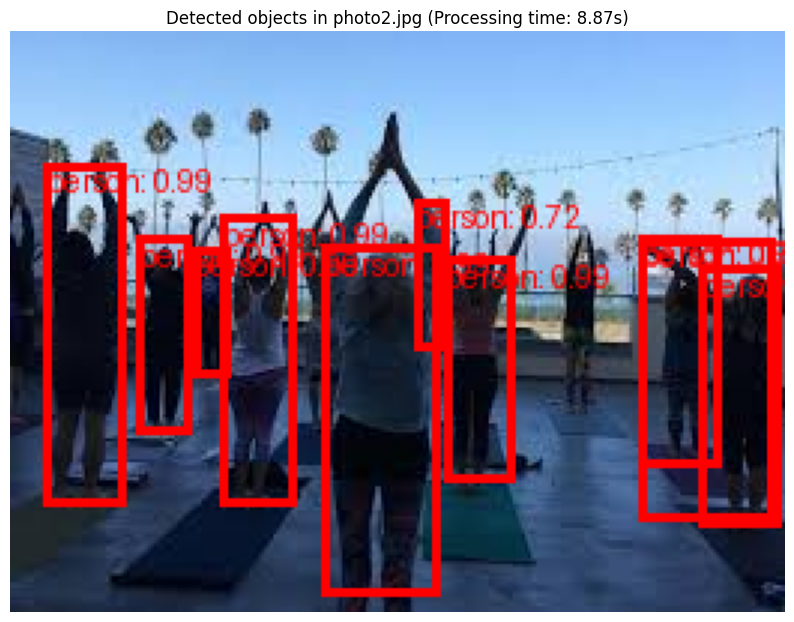

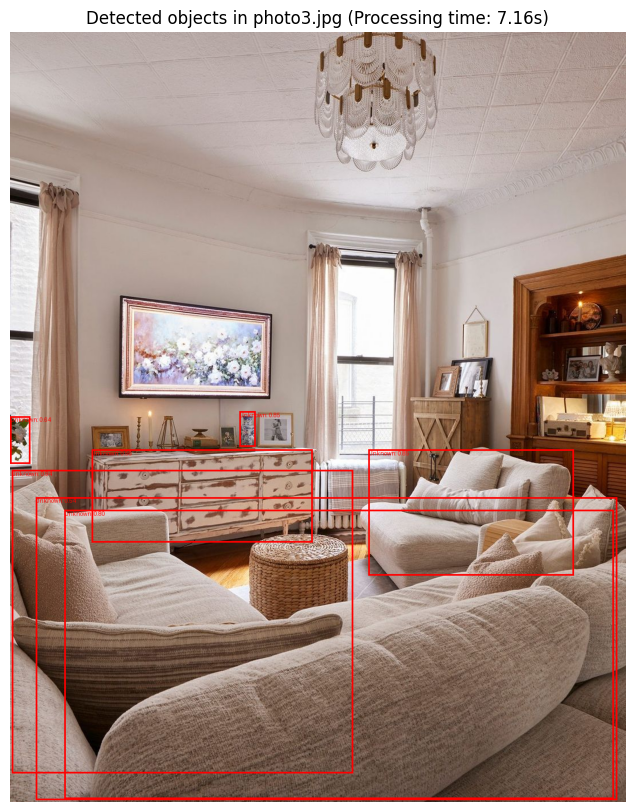

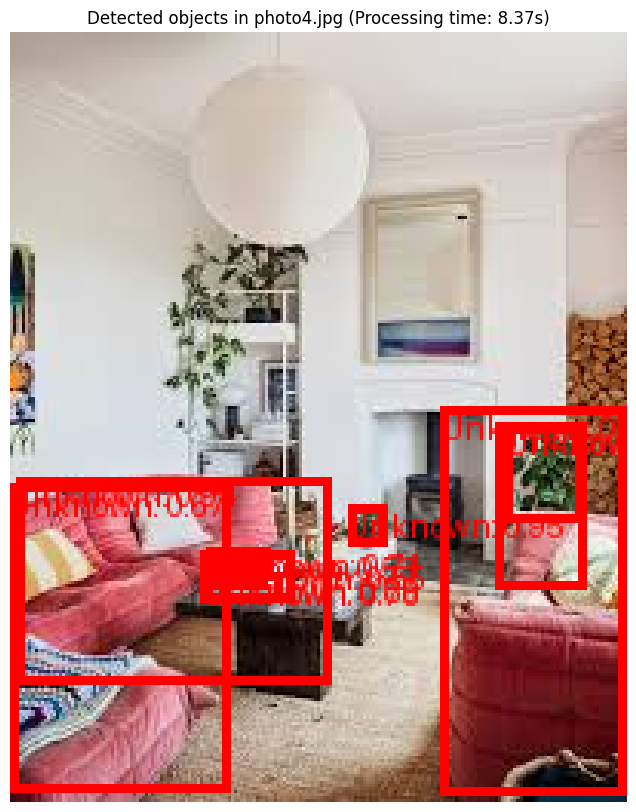

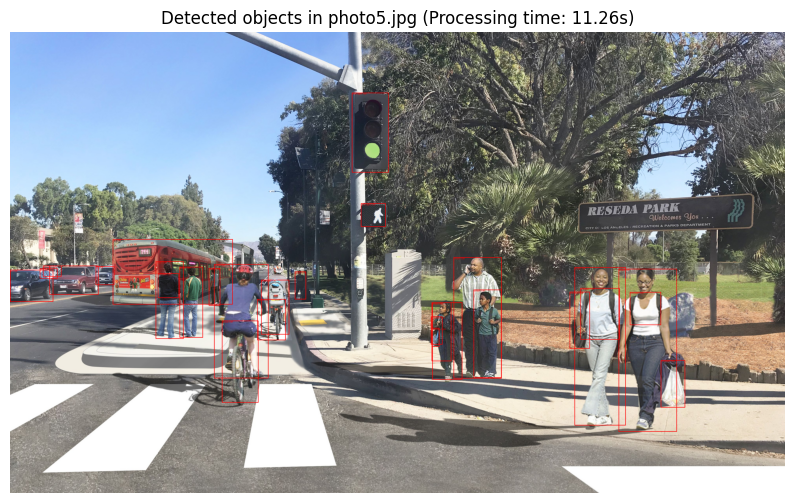

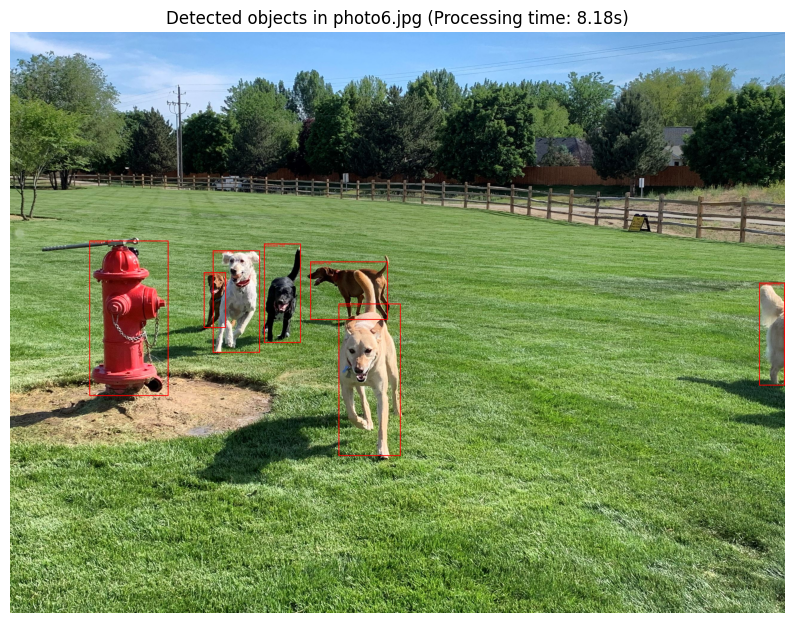

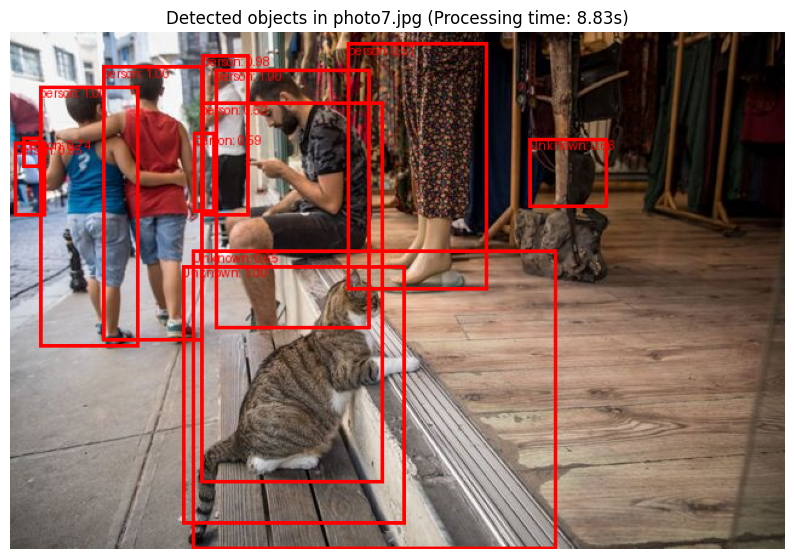

In [41]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import matplotlib.pyplot as plt
import time  # To track processing time

# Load pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Define the transform to apply to the input image
transform = transforms.Compose([
    transforms.ToTensor()  # Convert image to tensor
])

# List of image paths (your photo images)
image_paths = ["photo1.jpg", "photo2.jpg", "photo3.jpg", "photo4.jpg", "photo5.jpg", "photo6.jpg", "photo7.jpg"]

# COCO class labels (index from 1 to 91)
coco_labels = {
    1: "person", 2: "bicycle", 3: "car", 4: "motorcycle", 5: "airplane",
    6: "bus", 7: "train", 8: "truck", 9: "boat", 10: "traffic light",
    # Add more labels as per COCO dataset (this is just a small subset)
}

# Loop over all images
for image_path in image_paths:
    start_time = time.time()  # Start the timer

    # Load the input image
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    # Run the image through Faster R-CNN model
    with torch.no_grad():
        prediction = model(image_tensor)

    # Extract the predicted bounding boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']

    # Set a threshold for detection confidence
    threshold = 0.5  # Adjust this value based on your needs

    # Filter out weak detections based on the confidence score
    filtered_boxes = boxes[scores > threshold]
    filtered_labels = labels[scores > threshold]
    filtered_scores = scores[scores > threshold]

    # Draw the bounding boxes and labels on the original image
    draw = ImageDraw.Draw(image)
    for box, label, score in zip(filtered_boxes, filtered_labels, filtered_scores):
        xmin, ymin, xmax, ymax = box
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)

        # Get the label and probability
        label_name = coco_labels.get(label.item(), "Unknown")
        label_text = f"{label_name}: {score:.2f}"

        # Optionally, add the label text to the box
        font = ImageFont.load_default()  # Use default font (you can use a custom font if you like)
        draw.text((xmin, ymin), label_text, fill="red", font=font)

    # Calculate the processing time
    processing_time = time.time() - start_time

    # Show the result for each image
    plt.figure(figsize=(10, 10))
    plt.imshow(np.array(image))
    plt.axis("off")
    plt.title(f"Detected objects in {image_path} (Processing time: {processing_time:.2f}s)")
    plt.show()


In [42]:
# List the detected objects for each image
for image_path in image_paths:
    start_time = time.time()  # Start the timer

    # Load the input image
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

    # Run the image through Faster R-CNN model
    with torch.no_grad():
        prediction = model(image_tensor)

    # Extract the predicted bounding boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']

    # Set a threshold for detection confidence
    threshold = 0.5  # Adjust this value based on your needs

    # Filter out weak detections based on the confidence score
    filtered_labels = labels[scores > threshold]
    filtered_scores = scores[scores > threshold]

    # Prepare a list of objects found in the image with their confidence scores
    detected_objects = []
    for label, score in zip(filtered_labels, filtered_scores):
        label_name = coco_labels.get(label.item(), "Unknown")
        detected_objects.append(f"{label_name}: {score:.2f}")

    # Print the detected objects for the current image
    print(f"Detected objects in {image_path}:")
    if detected_objects:
        for obj in detected_objects:
            print(f"  - {obj}")
    else:
        print("  No objects detected.")
    print("\n" + "-"*40 + "\n")


Detected objects in photo1.jpg:
  - car: 1.00
  - person: 1.00
  - person: 0.99
  - car: 0.99
  - person: 0.99
  - person: 0.99
  - traffic light: 0.99
  - car: 0.98
  - person: 0.98
  - person: 0.98
  - person: 0.97
  - traffic light: 0.97
  - traffic light: 0.96
  - person: 0.96
  - person: 0.96
  - person: 0.96
  - car: 0.95
  - person: 0.94
  - person: 0.94
  - person: 0.93
  - car: 0.92
  - person: 0.92
  - car: 0.92
  - person: 0.90
  - bicycle: 0.89
  - car: 0.87
  - person: 0.86
  - traffic light: 0.85
  - car: 0.85
  - car: 0.84
  - traffic light: 0.83
  - car: 0.81
  - traffic light: 0.81
  - person: 0.80
  - car: 0.76
  - person: 0.74
  - car: 0.73
  - car: 0.73
  - car: 0.64
  - car: 0.64
  - Unknown: 0.63
  - person: 0.62
  - person: 0.60
  - traffic light: 0.57
  - person: 0.53

----------------------------------------

Detected objects in photo2.jpg:
  - person: 0.99
  - person: 0.99
  - person: 0.99
  - person: 0.99
  - person: 0.99
  - person: 0.99
  - person: 0.98
  -

In [ ]:
#Part B: Upload the code to GitHub, create a nice Read Me file, and attach the link to the Word
#document. Make sure the code in GitHub is well-commented. You do not need to upload the
#images on GitHub. The coding file should have the code and outputs printed. 6 points

In [ ]:
#(ii) Can you extract anything else from these images with or without using deep learning algorithms? 4 points
#Your Word document will have the comparison table and your comments on it. Do not write
#more than 2-3 sentences. Also, describe (ii) in the Word document with similar sentence
#limitations regarding what you did and the outcomes.